In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import geopandas as gpd
import contextily as ctx
from shapely.geometry import Point

from datetime import datetime

pd.set_option("display.max_column", 100)
# pd.set_option("display.precision", 15)

# Data Cleaning

In [30]:
crime_df = pd.read_csv("../data/kaggle/crime.csv", encoding="latin-1")
crime_df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [31]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [32]:
crime_df.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

## Initial observations
1. SHOOTING has a high percentage of null, needs to be handled
2. OCCURRED_ON_DATE and other time columns can be cast into datetime

In [33]:
# Drop columns
crime_df = crime_df.drop(['INCIDENT_NUMBER', 'REPORTING_AREA', 'OFFENSE_DESCRIPTION', 'UCR_PART', 'Location'], axis=1)
crime_df["OCCURRED_ON_DATE"] = pd.to_datetime(crime_df["OCCURRED_ON_DATE"])
crime_df

,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long
0,619,Larceny,D14,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,LINCOLN ST,42.357791,-71.139371
1,1402,Vandalism,C11,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,HECLA ST,42.306821,-71.060300
2,3410,Towed,D4,NaN,2018-09-03 19:27:00,2018,9,Monday,19,CAZENOVE ST,42.346589,-71.072429
3,3114,Investigate Property,D4,NaN,2018-09-03 21:16:00,2018,9,Monday,21,NEWCOMB ST,42.334182,-71.078664
4,3114,Investigate Property,B3,NaN,2018-09-03 21:05:00,2018,9,Monday,21,DELHI ST,42.275365,-71.090361
...,...,...,...,...,...,...,...,...,...,...,...,...
319068,3125,Warrant Arrests,D4,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,COVENTRY ST,42.336951,-71.085748
319069,111,Homicide,E18,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,RIVER ST,42.255926,-71.123172
319070,3125,Warrant Arrests,E18,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,RIVER ST,42.255926,-71.123172
319071,3125,Warrant Arrests,E13,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,NEW WASHINGTON ST,42.302333,-71.111565


In [34]:
crime_df[crime_df["STREET"].isna()]

,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long
15,3006,Medical Assistance,NaN,NaN,2018-09-03 19:43:00,2018,9,Monday,19,NaN,42.352875,-71.073830
25,3831,Motor Vehicle Accident Response,NaN,NaN,2018-09-03 18:20:00,2018,9,Monday,18,NaN,42.283593,-71.055657
39,1843,Drug Violation,NaN,NaN,2018-09-03 18:05:00,2018,9,Monday,18,NaN,42.306769,-71.084319
40,3125,Warrant Arrests,NaN,NaN,2018-09-03 18:05:00,2018,9,Monday,18,NaN,42.306769,-71.084319
41,1841,Drug Violation,NaN,NaN,2018-09-03 18:05:00,2018,9,Monday,18,NaN,42.306769,-71.084319
...,...,...,...,...,...,...,...,...,...,...,...,...
318811,3125,Warrant Arrests,E13,NaN,2015-07-17 00:00:00,2015,7,Friday,0,NaN,NaN,NaN
318812,1842,Drug Violation,E13,NaN,2015-07-17 00:00:00,2015,7,Friday,0,NaN,NaN,NaN
319015,3125,Warrant Arrests,E13,NaN,2015-07-17 09:23:00,2015,7,Friday,9,NaN,NaN,NaN
319016,1503,Firearm Violations,E13,NaN,2015-07-17 09:23:00,2015,7,Friday,9,NaN,NaN,NaN


From Google Maps this point is between Purchase St and Atlantic Ave, we will fill the value with Atlantic Ave because there are many more records

In [6]:
print(f"# crimes on Purchase St: {len(crime_df[crime_df['STREET'] == 'PURCHASE ST'])}")
print(f"# crimes on Atlantic Ave: {len(crime_df[crime_df['STREET'] == 'ATLANTIC AVE'])}")

# crimes on Purchase St: 43
# crimes on Atlantic Ave: 895


In [7]:
# Fill nan STREET value with ATLANTIC AVE
crime_df.loc[27078, "STREET"] = "ATLANTIC AVE"

In [8]:
# There are no records without STREET or LOCATION
crime_df[(crime_df["STREET"].isna()) & (crime_df["Location"]).isna()]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,STREET,Lat,Long,Location


In [9]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   INCIDENT_NUMBER      319073 non-null  object        
 1   OFFENSE_CODE         319073 non-null  int64         
 2   OFFENSE_DESCRIPTION  319073 non-null  object        
 3   DISTRICT             317308 non-null  object        
 4   REPORTING_AREA       319073 non-null  object        
 5   SHOOTING             1019 non-null    object        
 6   OCCURRED_ON_DATE     319073 non-null  datetime64[ns]
 7   DAY_OF_WEEK          319073 non-null  object        
 8   STREET               308202 non-null  object        
 9   Lat                  299074 non-null  float64       
 10  Long                 299074 non-null  float64       
 11  Location             319073 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(8)
memory usage: 29.2

# Data Visualization
## [Plotting example](https://www.kaggle.com/code/christotk/analyse-crimes-in-boston-with-geopandas-and-folium)

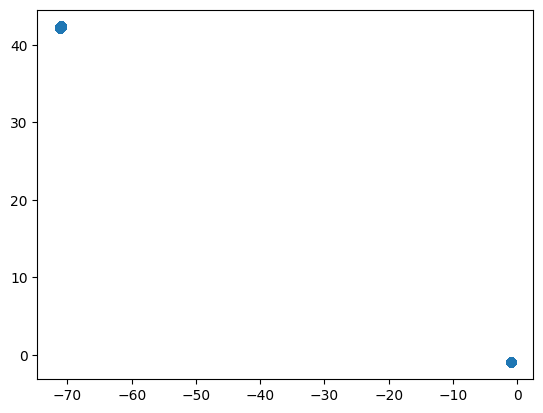

In [10]:
plt.scatter(x=crime_df["Long"], y=crime_df["Lat"])
plt.show()

In [11]:
boston_map = gpd.read_file("../data/boston.geojson")
boston_map.head()

,name,created_at,updated_at,cartodb_id,geometry
0,Roslindale,2013-02-19 04:40:34.216000+00:00,2013-02-19 04:40:34.466000+00:00,1,"MULTIPOLYGON (((-71.12593 42.27200, -71.12575 ..."
1,Jamaica Plain,2013-02-19 04:40:34.216000+00:00,2013-02-19 04:40:34.466000+00:00,2,"MULTIPOLYGON (((-71.09831 42.32630, -71.09858 ..."
2,Leather District,2013-02-19 04:40:34.216000+00:00,2013-02-19 04:40:34.466000+00:00,6,"MULTIPOLYGON (((-71.05838 42.34982, -71.05877 ..."
3,Roxbury,2013-02-19 04:40:34.216000+00:00,2013-02-19 04:40:34.466000+00:00,9,"MULTIPOLYGON (((-71.08314 42.34153, -71.08303 ..."
4,Fenway,2013-02-19 04:40:34.216000+00:00,2013-02-19 04:40:34.466000+00:00,17,"MULTIPOLYGON (((-71.11011 42.35207, -71.10986 ..."


In [12]:
import geoplot
import geoplot.crs as gcrs
import folium

# ax = geoplot.polyplot(
#     boston_map,
#     projection=gcrs.AlbersEqualArea(),
#     edgecolor='darkgrey',
#     facecolor='lightgrey',
#     linewidth=.3,
#     figsize=(12, 8)
# )

# plt.show()


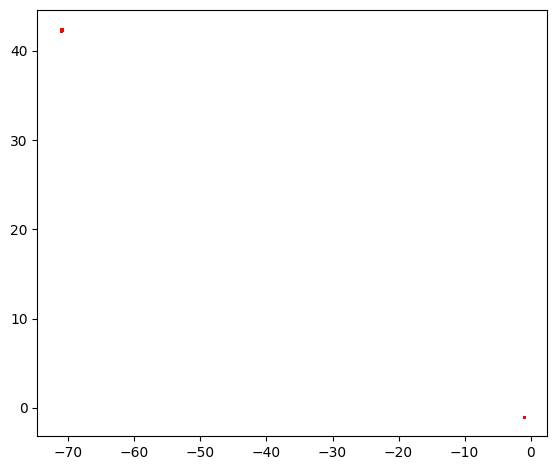

In [13]:
ax = boston_map.plot()
plt.scatter(x=crime_df["Long"], y=crime_df["Lat"], c='r', s=1)
plt.tight_layout()

In [14]:
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure(data=go.Scattergeo(
        lon = crime_df['Long'],
        lat = crime_df['Lat'],
        # text = crime_df['Location'],
        text = crime_df.index,
        mode = 'markers',
        # marker_color = df['cnt'],
        ))

fig.update_layout(
        title = 'Boston crimes<br>(Hover for coordinates and indices)',
        geo_scope='usa',
    )
fig.update_traces(marker=dict(size=3))
fig.update_geos(fitbounds="locations")
fig.show()

In [15]:
points_outside_bos = [23549,26444,72056,44358,19042,30862,29337,68068,28527,13665,]
crime_df.drop(index=points_outside_bos, inplace=True)
len(crime_df)

319063

## All points outside Boston have been removed now

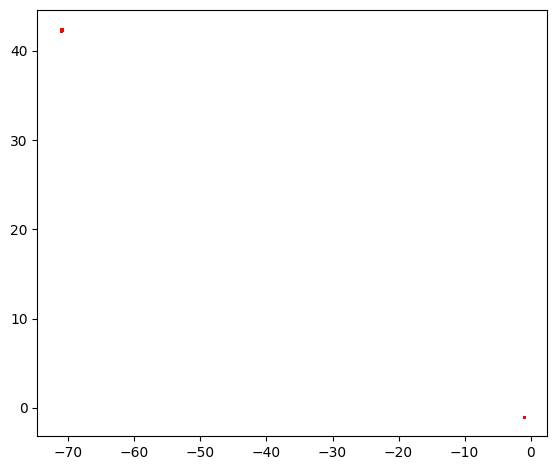

In [16]:
ax = boston_map.plot()
plt.scatter(x=crime_df["Long"], y=crime_df["Lat"], c='r', s=1)
plt.tight_layout()

# Data Analysis

In [17]:
most_common_crimes = pd.DataFrame({'Count': crime_df.OFFENSE_DESCRIPTION.value_counts().sort_values(ascending = False)
.head(10) # top n most common crimes
})
most_common_crimes

,Count
OFFENSE_DESCRIPTION,
SICK/INJURED/MEDICAL - PERSON,18783
INVESTIGATE PERSON,18754
M/V - LEAVING SCENE - PROPERTY DAMAGE,16323
VANDALISM,15153
ASSAULT SIMPLE - BATTERY,14791
VERBAL DISPUTE,13099
TOWED MOTOR VEHICLE,11286
INVESTIGATE PROPERTY,11124
LARCENY THEFT FROM BUILDING,9069


In [18]:
from folium.plugins import HeatMap

location_of_most_common_crimes = crime_df[crime_df.OFFENSE_DESCRIPTION.isin(most_common_crimes.index)].loc[:, ['Lat', 'Long']].dropna()

my_map=folium.Map(location = [42.320,-71.05], #Initiate map on Boston city
                  zoom_start = 11,
                  min_zoom = 11
)

HeatMap(data=location_of_most_common_crimes.sample(10000), radius=16).add_to(my_map)

my_map

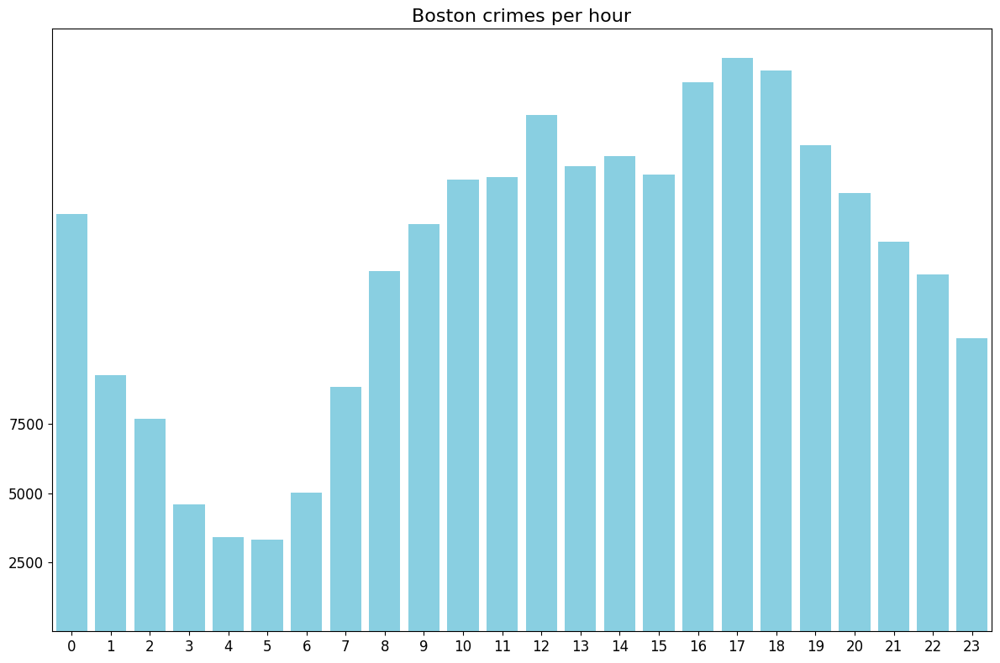

In [19]:
# Distribution of crimes per hour
crimes_per_hour = pd.DataFrame({'Count': crime_df["OCCURRED_ON_DATE"].dt.hour.value_counts().sort_index()})
plt.figure(figsize = (12,8))
sns.barplot(x = crimes_per_hour.index, y = crimes_per_hour['Count'], data = crimes_per_hour, color = '#7AD7F0')
plt.ylabel(None)
plt.xlabel(None)
plt.yticks(np.arange(2500, 10000, 2500))
plt.tick_params(labelsize = 12)
plt.title('Boston crimes per hour', fontsize = 16)
plt.tight_layout()

It seems that crimes are most commonly reported 12PM-6PM with another peak at 12AM

In [20]:
# Day of the week effect?
labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
crimes_per_day = pd.DataFrame({'Count': crime_df["OCCURRED_ON_DATE"].dt.day_name().value_counts().loc[labels]})
crimes_per_day

,Count
OCCURRED_ON_DATE,
Monday,45678
Tuesday,46383
Wednesday,46727
Thursday,46654
Friday,48492
Saturday,44816
Sunday,40313


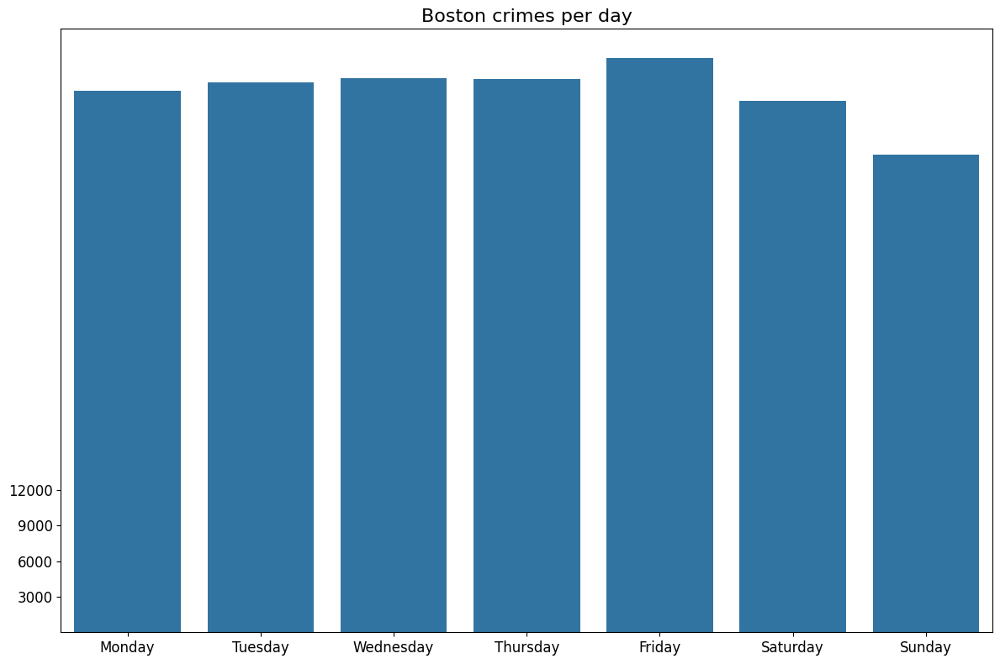

In [21]:
plt.figure(figsize = (12,8))
sns.barplot(x = crimes_per_day.index, y = 'Count', data = crimes_per_day)
plt.ylabel(None)
plt.xlabel(None)
plt.yticks(np.arange(3000, 15000, 3000))
plt.tick_params(labelsize = 12)
plt.title('Boston crimes per day', fontsize = 16)
plt.tight_layout()

In [22]:
print(crime_df["OCCURRED_ON_DATE"].min())
print(crime_df["OCCURRED_ON_DATE"].max())

2015-06-15 00:00:00
2018-09-03 21:25:00


In [23]:
# Is there a difference between months?
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
crimes_per_month = pd.DataFrame({'Count': crime_df["OCCURRED_ON_DATE"].dt.month_name().value_counts().sort_index().values}, index = months)
crimes_per_month

,Count
January,24086
February,34823
March,23475
April,21653
May,23610
June,34555
July,30566
August,24145
September,26195
October,23675


/var/folders/q0/tp61rdx579s1pr09fjqsx_gw0000gn/T/ipykernel_99751/3873751881.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




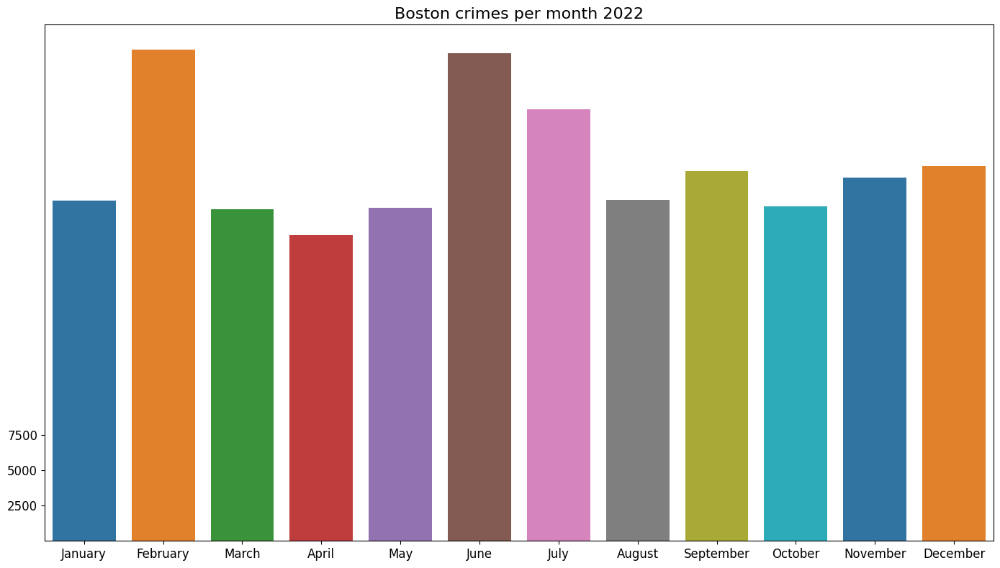

In [24]:
plt.figure(figsize = (14, 8))
sns.barplot(x = crimes_per_month.index, y = 'Count', data = crimes_per_month, palette = 'tab10')
plt.ylabel(None)
plt.xlabel(None)
plt.yticks(np.arange(2500, 10000, 2500))
plt.tick_params(labelsize = 12)
plt.title('Boston crimes per month 2022', fontsize = 16)
plt.tight_layout()

More crimes reported in the Summer

In [25]:
crime_df.reset_index(inplace=True, drop=True)
crime_df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,STREET,Lat,Long,Location
0,I182070945,619,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,Sunday,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,Tuesday,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,Monday,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,Monday,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,Monday,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...
319058,I050310906-00,3125,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,Sunday,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319059,I030217815-08,111,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,Thursday,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319060,I030217815-08,3125,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,Thursday,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319061,I010370257-00,3125,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,Tuesday,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [27]:
# Save cleaned dataset
crime_df.to_csv("../data/crime_kaggle_clean.csv", index=False)